<a href="https://colab.research.google.com/github/krGaurav310/AllColabProjects/blob/master/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files

In [ ]:
files.upload()

Saving Group_1.xlsx to Group_1.xlsx


{'Group_1.xlsx': b'PK\x03\x04\x14\x00\x08\x08\x08\x00\xf2\x93\xd9P\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00xl/drawings/drawing1.xml\x9d\xd0]n\xc20\x0c\x07\xf0\x13\xec\x0eU\xdeiZ\x18\x13C\x14^\xd0N0\x0e\xe0%n\x1b\x91\x8f\xca\x0e\xa3\xdc~\xd1J6i{\x01\x1em\xcb?\xf9\xef\xcdnt\xb6\xf8Db\x13|#\xea\xb2\x12\x05z\x15\xb4\xf1]#\x0e\xefo\xb3\x95(8\x82\xd7`\x83\xc7F\\\x90\xc5n\xfb\xb4\x195\xad\xcf\xbc\xa7"\xed{^\xa7\xb2\x11}\x8c\xc3ZJV=:\xe02\x0c\xe8\xd3\xb4\r\xe4 \xa6\x92:\xa9\t\xceIvV\xce\xab\xeaE\xf2@\x08\x9a{\xc4\xb8\x9f&\xe2\xea\xc1\x03\x9a\x03\xe3\xf3\xfeM\xd7\x84\xb65\n\xf7A\x9d\x1c\xfa8!\x84\x16b\xfa\x05\xf7f\xe0\xac\xa9\x07\xaeQ=P\xfc\x01\xc6\x7f\x823\x8a\x02\x876\x96*\xb8\xeb)\xd9HB\xfd<\t8\xfe\x1a\xf5\xdd\xc8R\xbe\xca\xd5_\xc8\xdd\x14\xc7\x01\x1dO\xc3,\xb9Cz\xc8\x87\xb1&^\xbe\x93eFw\xee\x81\xb7h\x03\x1d\x81\xcb\xc8\xb88\xf8\xe3\xdd\xb1*\xc96\xb5(+l\xb1^\xde\xad\xcc\xb3"\xb7_PK\x07\x08\x07bi\x83\x05\x01\x00\x00\x07\x03\x00\x00PK\x03\x04\x14\x00\x08\x08\x08\x00\xf2\

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib                  # 2D Plotting Library
import matplotlib.pyplot as plt
import matplotlib.gridspec as mgrid
import seaborn as sns              # Python Data Visualization Library based on matplotlib

import calendar 

### Plotly for interactive plots
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [ ]:

data = pd.read_excel('Group_1.xlsx')

In [ ]:
data.head()

,Port Name,State,Port Code,Border,Date,Measure,Value
0,Detroit,MI,3801,US-Canada Border,2003-12-01,Trucks,121076
1,Port Angeles,WA,3007,US-Canada Border,2003-12-01,Personal Vehicles,0
2,Oroville,WA,3019,US-Canada Border,2003-12-01,Rail Containers Empty,0
3,Wildhorse,MT,3323,US-Canada Border,2003-12-01,Truck Containers Full,0
4,Tornillo-Fabens,TX,2404,US-Mexico Border,2003-12-01,Rail Containers Empty,0


In [ ]:
data.isnull().any()

Port Name    False
State        False
Port Code    False
Border       False
Date         False
Measure      False
Value        False
dtype: bool

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])

In [ ]:
borders = data['Border'].unique()
print(borders)

['US-Canada Border' 'US-Mexico Border']


In [ ]:
years = data['Date'].map(lambda x: x.year).unique()

In [ ]:
print("There are {} port names.".format(len(data['Port Name'].unique())))
print("There are {} port codes.".format(len(data['Port Code'].unique())))
#print("There are {} different locations.".format(len(data['Location'].unique())))

There are 108 port names.
There are 109 port codes.


# It seems that Eastport has two different port codes, and that's the source of the discrepancy between the number of codes and the names. Indeed, one corresponds to Eastpot, Idaho, and the other one to Eastport, Maine.

In [ ]:
ports = data[['Port Name','Port Code']].drop_duplicates()
ports[ports['Port Name'].duplicated(keep = False)]

,Port Name,Port Code
11,Eastport,3302
31,Eastport,103


In [ ]:
data.iloc[[11,31]] # and getting the details of those two ports

,Port Name,State,Port Code,Border,Date,Measure,Value
11,Eastport,ID,3302,US-Canada Border,2003-12-01,Train Passengers,168
31,Eastport,ME,103,US-Canada Border,2003-12-01,Train Passengers,0


In [ ]:
data.loc[(data['Port Name'] == 'Eastport') & (data['State'] == 'Idaho'), 'Port Name'] = 'Eastport, ID'

In [ ]:
# take the port's unique code and location
locs = data[['Port Code','Date']]

# take only unique values
locs = locs.drop_duplicates()
print("There are {} different pairs of port code's and Date".format(len(locs)))
# how many locations has each port?
ls = locs['Port Code'].value_counts()
pts = locs['Date'].value_counts()

# Another way of doing the same...
# ls = locs.groupby(['Port Code']).count()
print('')
print('Port codes and # of Dates:')
print(ls.head(10))
print('')
print('Date and # of ports:')
print(pts.head(10))
print(pts.tail(10))



There are 9951 different pairs of port code's and Date

Port codes and # of Dates:
3802    96
3424    96
2307    96
2403    96
2507    96
2603    96
3011    96
3019    96
3403    96
3419    96
Name: Port Code, dtype: int64

Date and # of ports:
2003-09-01    109
2003-06-01    109
2003-10-01    109
2003-08-01    109
2003-07-01    109
2003-12-01    108
2003-04-01    108
2003-11-01    108
2003-01-01    108
2003-05-01    108
Name: Date, dtype: int64
1999-12-01    103
2002-03-01    103
1997-03-01    103
1998-08-01    103
2000-01-01    103
2002-04-01    103
1997-04-01    103
1998-09-01    103
2000-02-01    103
2002-05-01    103
Name: Date, dtype: int64


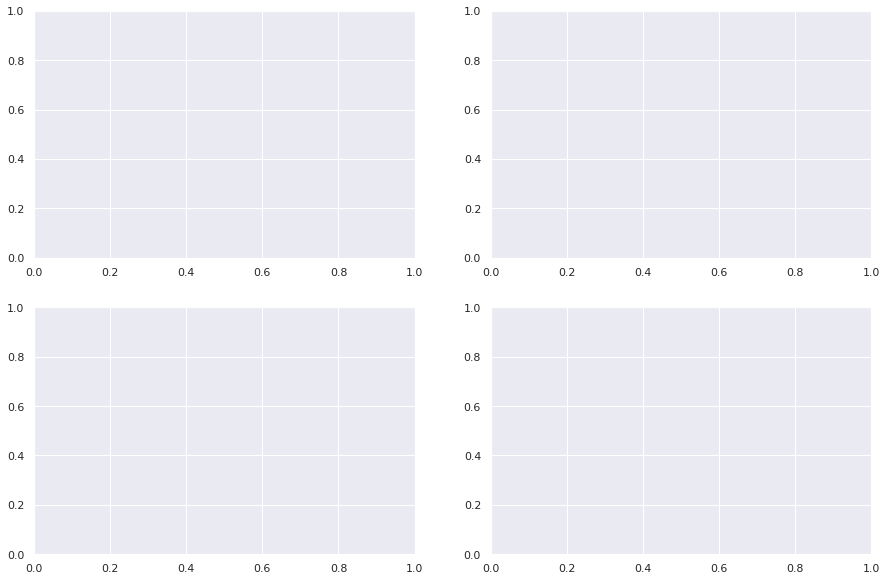

In [ ]:
#f,ax = plt.subplots(ncols=2, nrows=2, figsize=(15,10))
#sns.set(style = "darkgrid")

ValueError: ignored

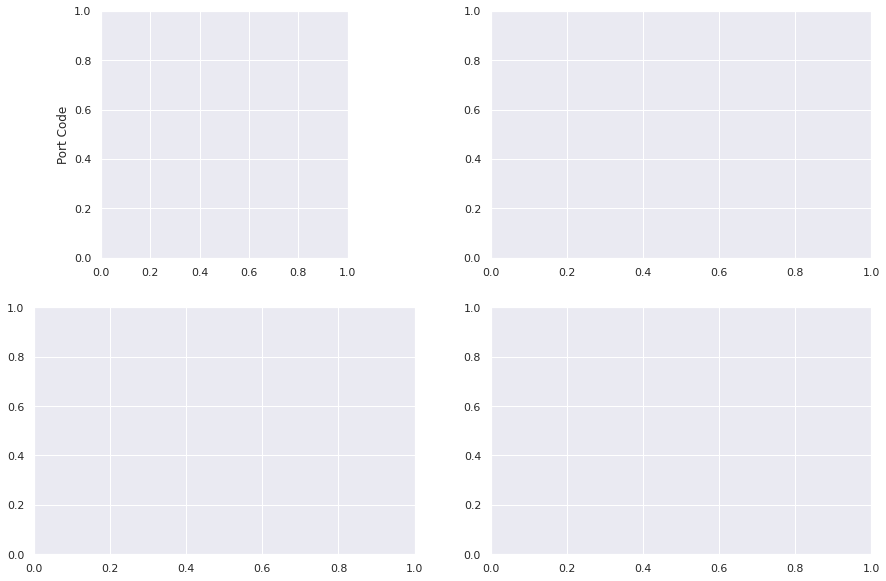

In [ ]:
f,ax = plt.subplots(ncols=2, nrows=2, figsize=(15,10))
sns.set(style = "darkgrid")

# Pie plots
# This function generates autopct, for displaying both the percent value and the original value.
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%  ({v:d})'.format(p=pct,v=val)
    return my_autopct

ls.value_counts().plot.pie(explode = [0.15,0,0],
                           autopct = make_autopct(ls.value_counts().values),
                           ax = ax[0,0])
ax[0,0].set(title = '# of locations per port', ylabel = '')
pts.value_counts().plot.pie(explode = [0.15,0], 
                            autopct = make_autopct(pts.value_counts().values), 
                            ax = ax[1,0])
ax[1,0].set(title = '# of ports per location', ylabel = '')


In [ ]:

# Countplots using seaborn
ax[0,1] = sns.countplot(ls, ax=ax[0,1])
ax[0,1].set(title = '# of locations per port', xlabel = '# of locations')
ax[1,1] = sns.countplot(pts, ax=ax[1][1])
ax[1,1].set(title = '# of ports per location', xlabel = '# of ports')

plt.subplots_adjust(
    wspace =  0.25,     # the amount of width reserved for blank space between subplots
    hspace = 0.3 # the amount of height reserved for white space between subplots
)

<Figure size 432x288 with 0 Axes>

PEOPLE

In [ ]:
people = data[data['Measure'].isin(['Personal Vehicle Passengers', 'Bus Passengers','Pedestrians', 'Train Passengers'])]
vehicles = data[data['Measure'].isin(['Trucks', 'Rail Containers Full','Truck Containers Empty', 'Rail Containers Empty',
       'Personal Vehicles', 'Buses', 'Truck Containers Full'])]

# The feature measure indicates the type of counting. Among the 'Measure' types, 'Personal Vehicle Passengers', 'Bus Passengers','Pedestrians' and 'Train Passengers' count people, whereas the others count vehicles.

In [ ]:
people # # The feature measure indicates the type of counting. Among the 'Measure' types, 'Personal Vehicle Passengers', 'Bus Passengers','Pedestrians' and 'Train Passengers' count people, whereas the others count vehicles.

,Port Name,State,Port Code,Border,Date,Measure,Value
6,Westhope,ND,3419,US-Canada Border,2003-12-01,Pedestrians,0
11,Eastport,ID,3302,US-Canada Border,2003-12-01,Train Passengers,168
17,San Luis,AZ,2608,US-Mexico Border,2003-12-01,Bus Passengers,37
19,Presidio,TX,2403,US-Mexico Border,2003-12-01,Pedestrians,1958
20,Carbury,ND,3421,US-Canada Border,2003-12-01,Pedestrians,0
...,...,...,...,...,...,...,...
119395,Presidio,TX,2403,US-Mexico Border,1996-01-01,Pedestrians,645
119396,Fortuna,ND,3417,US-Canada Border,1996-01-01,Bus Passengers,568
119398,St. John,ND,3405,US-Canada Border,1996-01-01,Personal Vehicle Passengers,3278
119402,Ogdensburg,NY,701,US-Canada Border,1996-01-01,Pedestrians,0


In [ ]:
vehicles

,Port Name,State,Port Code,Border,Date,Measure,Value
0,Detroit,MI,3801,US-Canada Border,2003-12-01,Trucks,121076
1,Port Angeles,WA,3007,US-Canada Border,2003-12-01,Personal Vehicles,0
2,Oroville,WA,3019,US-Canada Border,2003-12-01,Rail Containers Empty,0
3,Wildhorse,MT,3323,US-Canada Border,2003-12-01,Truck Containers Full,0
4,Tornillo-Fabens,TX,2404,US-Mexico Border,2003-12-01,Rail Containers Empty,0
...,...,...,...,...,...,...,...
119406,Point Roberts,WA,3017,US-Canada Border,1996-01-01,Rail Containers Empty,0
119408,Tecate,CA,2505,US-Mexico Border,1996-01-01,Trucks,3228
119409,Calais,ME,115,US-Canada Border,1996-01-01,Trucks,8955
119410,Carbury,ND,3421,US-Canada Border,1996-01-01,Truck Containers Empty,0


In [ ]:
data['Measure'].unique()

array(['Trucks', 'Personal Vehicles', 'Rail Containers Empty',
       'Truck Containers Full', 'Pedestrians', 'Buses',
       'Train Passengers', 'Bus Passengers', 'Trains',
       'Personal Vehicle Passengers', 'Rail Containers Full',
       'Truck Containers Empty'], dtype=object)

In [ ]:
people_borders = people[['Border','Value']].groupby('Border').sum()
people_borders

,Value
Border,
US-Canada Border,708845566
US-Mexico Border,2089594559


In [ ]:
people_borders = people[['Border','Value']].groupby('Border').sum()

In [ ]:
people_borders1 = people[['Border','Value']]

In [ ]:
data[['Port Code', 'Border', 'Date', 'Measure','Value']].head(50)

,Port Code,Border,Date,Measure,Value
0,3801,US-Canada Border,2003-12-01,Trucks,121076
1,3007,US-Canada Border,2003-12-01,Personal Vehicles,0
2,3019,US-Canada Border,2003-12-01,Rail Containers Empty,0
3,3323,US-Canada Border,2003-12-01,Truck Containers Full,0
4,2404,US-Mexico Border,2003-12-01,Rail Containers Empty,0
5,2608,US-Mexico Border,2003-12-01,Rail Containers Empty,0
6,3419,US-Canada Border,2003-12-01,Pedestrians,0
7,3422,US-Canada Border,2003-12-01,Buses,8
8,3406,US-Canada Border,2003-12-01,Buses,0
9,106,US-Canada Border,2003-12-01,Personal Vehicles,19655


In [ ]:
people_borders.head()

,Border,Value
6,US-Canada Border,0
11,US-Canada Border,168
17,US-Mexico Border,37
19,US-Mexico Border,1958
20,US-Canada Border,0
23,US-Canada Border,15
24,US-Mexico Border,311122
30,US-Canada Border,66
58,US-Mexico Border,42
77,US-Mexico Border,213122


In [ ]:
values = people_borders.values.flatten()
labels = people_borders.index
fig = go.Figure(data=[go.Pie(labels = labels, values=values)])
fig.update(layout_title_text='Total inbound persons, since 1996')
fig.show()

In [ ]:
# Take the values and set the date as index
p = people[['Date','Border','Value']].set_index('Date')

# Group by years and border
p = p.groupby([p.index.year, 'Border']).sum()
p.head(10)

Value
Date Border                     
1996 US-Canada Border  105762398
     US-Mexico Border  207586832
1997 US-Canada Border   97570223
     US-Mexico Border  261050472
1998 US-Canada Border   93097261
     US-Mexico Border  274125727
1999 US-Canada Border   94573669
     US-Mexico Border  293109831
2000 US-Canada Border   95776909
     US-Mexico Border  290368364

In [ ]:
# Take the values and set the date as index
p = people[['Date','Border','Value']].set_index('Date')

# Group by years and border
p = p.groupby([p.index.year, 'Border']).sum()
p.head(10)

Value
Date Border                     
1996 US-Canada Border  105762398
     US-Mexico Border  207586832
1997 US-Canada Border   97570223
     US-Mexico Border  261050472
1998 US-Canada Border   93097261
     US-Mexico Border  274125727
1999 US-Canada Border   94573669
     US-Mexico Border  293109831
2000 US-Canada Border   95776909
     US-Mexico Border  290368364

In [ ]:
val_MEX = p.loc(axis=0)[:,'US-Mexico Border'].values.flatten().tolist()
val_CAN = p.loc(axis=0)[:,'US-Canada Border'].values.flatten().tolist()
yrs = p.unstack(level=1).index.values

# Bar chart 
fig = go.Figure(go.Bar(x = yrs, y = val_MEX, name='US-Mexico Border'))
fig.add_trace(go.Bar(x = yrs, y = val_CAN, name='US-Canada Border'))

fig.update_layout(title = 'Total inbounds (people), by border and years', barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.show()

NameError: ignored

* Studying the annual growth, by borders:

In [ ]:
p

NameError: ignored

In [ ]:
# Unstack the Data Frame
vals = p.unstack().Value
val_MEX = vals['US-Mexico Border']
val_CAN = vals['US-Canada Border']
val_TOT = val_MEX + val_CAN
growth_MEX = val_MEX.diff().dropna()/val_MEX.values[:-1]*100
growth_CAN = val_CAN.diff().dropna()/val_CAN.values[:-1]*100
growth_TOT = val_TOT.diff().dropna()/val_TOT.values[:-1]*100

yrs = vals.index.values

# Bar chart 
# We drop the values for 2019 as there are data only until april
fig = go.Figure(go.Bar(x = yrs, y = growth_MEX.values[:-1], name='US-Mexico Border'))
fig.add_trace(go.Bar(x = yrs, y = growth_CAN.values[:-1], name='US-Canada Border'))
fig.add_trace(go.Line(x = yrs, y = growth_TOT.values[:-1], name='Total'))

fig.update_layout(title = 'Border transit annual growth (people), by border and years', 
                  barmode='group', 
                  xaxis={'categoryorder':'category ascending'},
                  yaxis=go.layout.YAxis(
                      title=go.layout.yaxis.Title(
                      text="Annual growth (%)",
                      font=dict(                      
                      size=18,
                      color="#7f7f7f")
            
        )
    )
                 
                 )
fig.show()

/usr/local/lib/python3.6/dist-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [ ]:
val_MEX = vals['US-Mexico Border']


NameError: ignored

How do people cross the borders?

In [ ]:
# Take the values and set the date as index
m = people[['Date','Measure','Value']].set_index('Date')

# Group by years and border
m = m.groupby([m.index.year,'Measure']).sum()
m.head(10)

NameError: ignored

In [ ]:
# Bar chart 
measures = ['Personal Vehicle Passengers', 'Bus Passengers','Pedestrians', 'Train Passengers']
yrs = m.unstack().index.values

fig = go.Figure(data = [go.Bar(x = yrs, y = m.loc(axis=0)[:, mes].values.flatten().tolist(), name = mes) for mes in measures ])
    
fig.update_layout(title = 'Total inbounds (people), by measure and years', barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.show()

NameError: ignored

Total # of people crossing the border since 1996, splited by Measure

In [ ]:
people_measure = people[['Measure','Value']].groupby('Measure').sum()
values = people_measure.values.flatten()
labels = people_measure.index
fig = go.Figure(data=[go.Pie(labels = labels, values=values)])
fig.update(layout_title_text='Total inbound persons, since 1996')
fig.show()

Do people entering from Mexico and Canada have the same prefered means of transportation for crossing the border?

In [ ]:
# Take the values and set the date as index
mb = people[['Date','Border','Measure','Value']].set_index('Date')

# Group by years and border
mb = mb.groupby([mb.index.year,'Border','Measure']).sum()

# Bar chart, US-Canada Border

fig = go.Figure(data = [go.Bar(x = yrs, y = mb.loc(axis=0)[:,'US-Canada Border', mes].values.flatten().tolist(), name = mes) for mes in measures ])
fig.update_layout(title = 'US-Canada inbounds (people), by measure and years', barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.show()

In [ ]:
# Bar chart, US-Canada Border

fig = go.Figure(data = [go.Bar(x = yrs, y = mb.loc(axis=0)[:,'US-Mexico Border', mes].values.flatten().tolist(), name = mes) for mes in measures ])
fig.update_layout(title = 'US-Mexico inbounds (people), by measure and years', barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.show()

In [ ]:
 # Interestingly, the number of pedestrians crossing the US-Mexico Border seems to be almost constant in time, compared to the number of Personal Vehicle Passengers, 
 ## Take the values and set the date as index

start_year = 2014
end_year = 2018

m = people[['Date','Border','Measure','Value']].set_index('Date')

# Group by years and measure
m = m.groupby([m.index.year,'Border', 'Measure']).sum()

m_can = m.loc(axis=0)[start_year:end_year,'US-Canada Border'].groupby('Measure').mean()
m_mex = m.loc(axis=0)[start_year:end_year,'US-Mexico Border'].groupby('Measure').mean()

# plotting, pie charts
f,ax = plt.subplots(ncols=2, nrows=1)

m_can['Value'].plot.pie( ax = ax[0], autopct = '%1.1f%%')
m_mex['Value'].plot.pie( ax = ax[1], autopct = '%1.1f%%')

ax[0].set(title = 'Canadian border, average from {} to {}'.format(start_year,end_year), ylabel = '')
ax[1].set(title = 'Mexican border, average from {} to {}'.format(start_year,end_year), ylabel = '')
f.show()which learly sets the trend

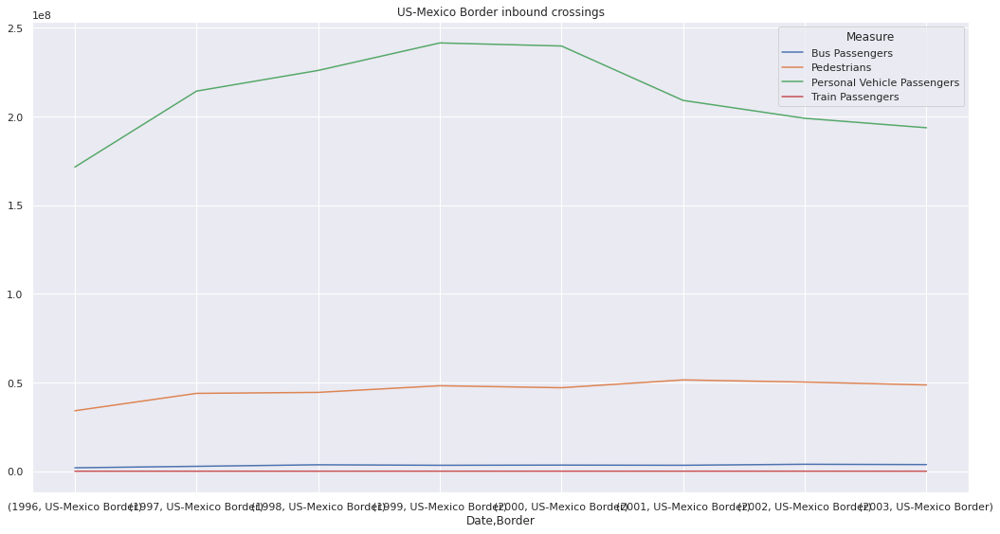

In [ ]:
sns.set(rc={'figure.figsize':(15, 8)})
fig,ax = plt.subplots()
mb.loc(axis=0)[:,'US-Mexico Border', :].unstack().Value.plot(title='US-Mexico Border inbound crossings',ax=ax)
fig.tight_layout()
fig.show()


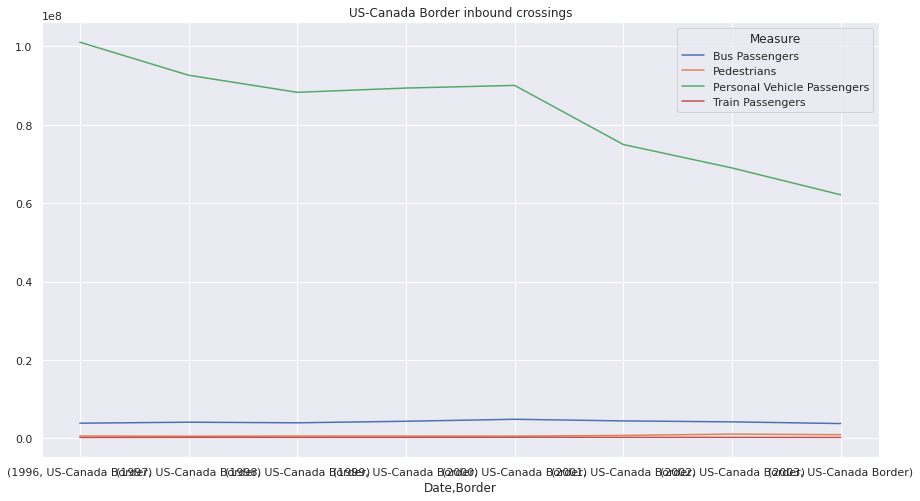

In [ ]:
mb.loc(axis=0)[:,'US-Canada Border', :].unstack().Value.plot(title='US-Canada Border inbound crossings') #Does it also happen in Canada?


In [ ]:
# Take the values and set the date as index

start_year = 2014
end_year = 2018

m = people[['Date','Border','Measure','Value']].set_index('Date')

# Group by years and measure
m = m.groupby([m.index.year,'Border', 'Measure']).sum()

m_can = m.loc(axis=0)[start_year:end_year,'US-Canada Border'].groupby('Measure').mean()
m_mex = m.loc(axis=0)[start_year:end_year,'US-Mexico Border'].groupby('Measure').mean()



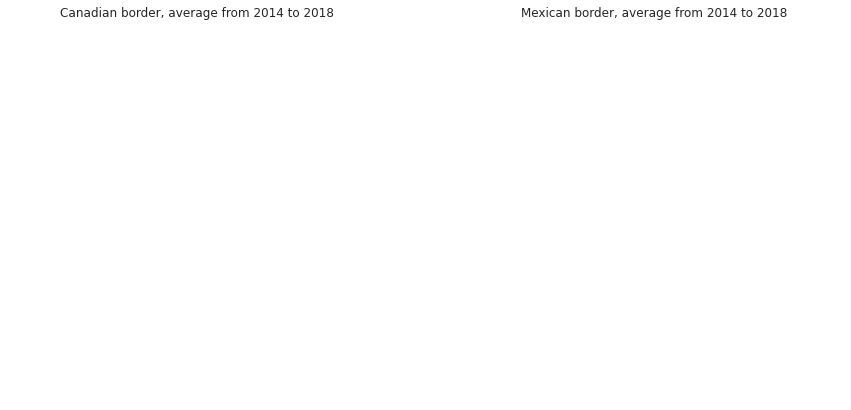

In [ ]:
# plotting, pie charts
f,ax = plt.subplots(ncols=2, nrows=1)

m_can['Value'].plot.pie( ax = ax[0], autopct = '%1.1f%%')
m_mex['Value'].plot.pie( ax = ax[1], autopct = '%1.1f%%')

ax[0].set(title = 'Canadian border, average from {} to {}'.format(start_year,end_year), ylabel = '')
ax[1].set(title = 'Mexican border, average from {} to {}'.format(start_year,end_year), ylabel = '')
f.show()

COORELATION

In [ ]:
# Inbounds by years and Measure, since 1996
d = data[['Date','Measure','Value']].set_index('Date')

year_measure_df = d.pivot_table('Value', index = d.index.year, columns = 'Measure', aggfunc = 'sum')
year_measure_df

Measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
Date,,,,,,,,,,,,
1996,5813778,292789,34717351,272593220,101960373,268134,472219,224881,38966,1599429,3124031,8685180
1997,6896919,389969,44461186,307001980,119003203,354288,620145,260610,40541,1920118,3708600,9516639
1998,7608484,436803,45060023,314295857,120451297,513721,1079074,258624,38816,2405012,6223216,10217477
1999,7725590,469496,48801064,330891505,126689655,611927,1376950,265341,38949,2768834,7641245,11176168
2000,8338859,460056,47677158,329841500,129202573,684988,1481674,287756,40555,2747769,7684947,11573707
2001,7823231,457697,52253906,284076951,123834970,764043,1597954,272547,41046,2936782,7942907,11081868
2002,8139017,470321,51362762,268007308,122388232,774094,1653204,270242,40579,2913657,8340836,11342566
2003,7526855,475676,49604705,255834018,118313556,806863,1668857,246897,41911,2626413,8273120,10973782


In [ ]:
year_measure_df.corr().style.background_gradient(cmap='coolwarm').set_precision(2)

Measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
Measure,,,,,,,,,,,,
Bus Passengers,1.00,0.93,0.88,0.30,0.93,0.83,0.86,0.89,0.36,0.93,0.88,0.96
Buses,0.93,1.00,0.95,0.16,0.88,0.89,0.91,0.73,0.45,0.93,0.93,0.94
Pedestrians,0.88,0.95,1.00,0.02,0.83,0.90,0.90,0.74,0.57,0.93,0.89,0.90
Personal Vehicle Passengers,0.30,0.16,0.02,1.00,0.55,-0.20,-0.12,0.53,-0.49,0.09,-0.04,0.18
Personal Vehicles,0.93,0.88,0.83,0.55,1.00,0.66,0.70,0.94,0.27,0.83,0.74,0.87
Rail Containers Empty,0.83,0.89,0.90,-0.20,0.66,1.00,0.99,0.57,0.63,0.93,0.97,0.91
Rail Containers Full,0.86,0.91,0.90,-0.12,0.70,0.99,1.00,0.60,0.55,0.96,0.99,0.94
Train Passengers,0.89,0.73,0.74,0.53,0.94,0.57,0.60,1.00,0.27,0.75,0.62,0.80
Trains,0.36,0.45,0.57,-0.49,0.27,0.63,0.55,0.27,1.00,0.40,0.46,0.43


In [ ]:
# Incoming people by state and type of vehicle, since 1996

PStateVehicle_df = people.pivot_table('Value', index = 'State', columns = 'Measure', aggfunc = 'sum')
PStateVehicle_df

Measure,Bus Passengers,Pedestrians,Personal Vehicle Passengers,Train Passengers
State,,,,
AK,1123071,3568,2093587,247327
AZ,952679,67309561,195756038,12180
CA,10255357,140237858,526186388,48081
ID,124553,21024,3856868,14825
ME,503521,914646,62411323,24645
MI,7914503,60930,210944958,379535
MN,730804,256459,22618797,176375
MT,319166,106898,12135508,9555
ND,849048,69611,13059407,39167


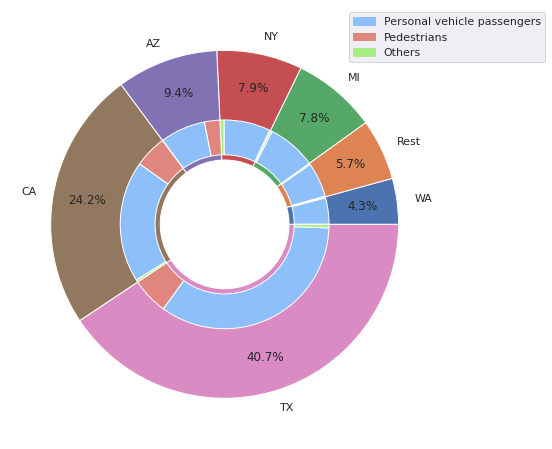

In [ ]:
rest = PStateVehicle_df[PStateVehicle_df.sum(axis=1)  < PStateVehicle_df.sum().sum()*0.04].sum().rename('Rest')

t = PStateVehicle_df[PStateVehicle_df.sum(axis=1)  > PStateVehicle_df.sum().sum()*0.04]
t = t.append(rest)
# Sort them by total flux
t = t.iloc[np.argsort(t.sum(axis=1)).values]
# Combine Train and bus passagners in "others"
t['Other']=t['Bus Passengers'] + t['Train Passengers']
t = t.drop(['Bus Passengers', 'Train Passengers'], axis=1)

# Plot
fig, ax = plt.subplots()

size = 0.4

a= t.sum(axis=1).plot.pie(radius = 1,
       wedgeprops=dict(width=size+0.23, edgecolor='w'), ax = ax, autopct = '%1.1f%%', pctdistance= 0.8)

b=pd.Series(t.values.flatten()).plot.pie(radius = 1- size,colors = ['#DF867E','#8DC0FB','#A9EE84'],
       wedgeprops=dict(width=size-0.2, edgecolor='w'), ax=ax, labels = None)

ax.set(ylabel=None)
red_patch = matplotlib.patches.Patch(color='#DF867E', label='Pedestrians')
blue_patch = matplotlib.patches.Patch(color='#8DC0FB', label='Personal vehicle passengers')
green_patch = matplotlib.patches.Patch(color='#A9EE84', label='Others')
plt.legend(handles=[blue_patch,red_patch, green_patch], loc='best', bbox_to_anchor=(0.75, 0.5, 0.5, 0.5))

plt.show()

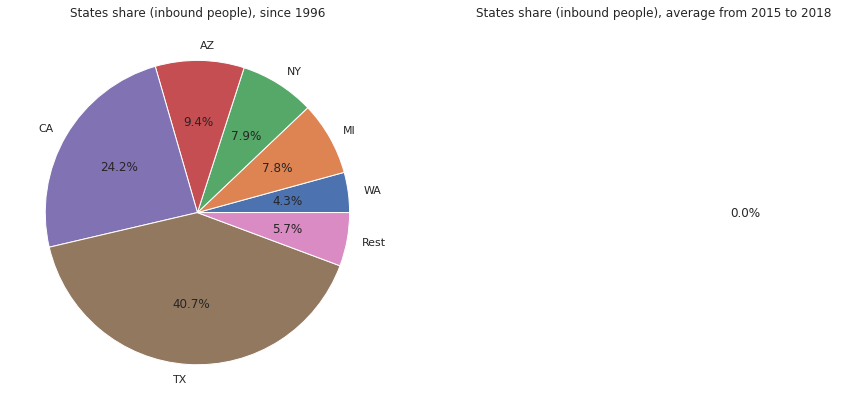

In [ ]:
start_year = 2015
end_year = 2018

# Group by years and states
p_states = people[['Date','State','Value']].set_index('Date')
p_states = p_states.groupby([p_states.index.year, 'State']).sum()
# Select date range and compute mean
p_states = p_states.loc(axis=0)[start_year:end_year,:].groupby('State').mean()
# Sort, for nice visualization
p_states = p_states['Value'].sort_values()
# Take only states with more than 4% of share 
rest = p_states[p_states < p_states.sum()*.04].sum()
p_states = p_states[p_states > p_states.sum()*.04].append(pd.Series({'Rest' : rest}))

# Same for all years:
p_states_tot = people[['State','Value']].groupby('State').sum()
p_states_tot = p_states_tot['Value'].sort_values()
rest_tot = p_states_tot[p_states_tot < p_states_tot.sum()*.04].sum()
p_states_tot = p_states_tot[p_states_tot > p_states_tot.sum()*.04].append(pd.Series({'Rest' : rest_tot}))


# plotting, pie charts
f,ax = plt.subplots(ncols=2, nrows=1)

p_states_tot.plot.pie( ax = ax[0], autopct = '%1.1f%%')
p_states.plot.pie( ax = ax[1], autopct = '%1.1f%%')

ax[0].set(title = 'States share (inbound people), since 1996', ylabel = '')
ax[1].set(title = 'States share (inbound people), average from {} to {}'.format(start_year,end_year), ylabel = '')
f.show()

VISUALIZATION


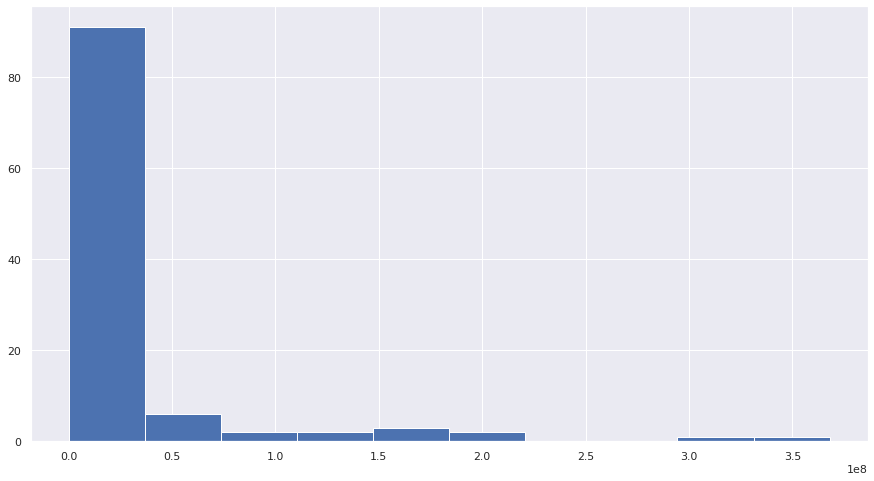

In [ ]:
p_ports = people[['Port Name','Value']].groupby('Port Name').sum().Value.sort_values(ascending = False)
p_ports.hist()

plt.show()

The vast majority of ports have had less than 100M crossings, whereas a very few of them have a lot. Border crossings are concentrated in few ports among the 114 of them. Which are the most transited?

In [ ]:
num_p = 10

pctg = p_ports.head(num_p).sum()/p_ports.sum()*100

print('The {} most transited ports are:'.format(num_p))
print(p_ports.head(num_p))
print('')
print ('The {} most transited ports (out of 117) take {:.2f} % of all persons crossings into the US.'.format(num_p, pctg))

The 10 most transited ports are:
Port Name
El Paso                  368030468
San Ysidro               297330171
Hidalgo                  197410910
Calexico                 196954906
Laredo                   181975321
Brownsville              161756240
Buffalo-Niagara Falls    148629334
Detroit                  146008556
Nogales                  119393045
Otay Mesa                 85652939
Name: Value, dtype: int64

The 10 most transited ports (out of 117) take 68.01 % of all persons crossings into the US.


In [ ]:
#Visualizing the total number of persons crossing the border towards the US, including a rolling mean (by years) to see the trend:

In [ ]:
p_locs = people[['Location','Value']].groupby('Location').sum().reset_index()

# functions to get coordinates,
def get_lon(point) :
    par = point[7:-1].partition(' ')
    return float(par[0])

def get_lat(point) :
    par = point[7:-1].partition(' ')
    return float(par[2])

# adding a column with the coordinates to the dataframe
p_locs['lat'] = p_locs.Location.apply(lambda x: get_lat(x))
p_locs['lon'] = p_locs.Location.apply(lambda x: get_lon(x))

# As some locations have 2 ports, we have to take are of it in the labelling,
ps = data[['Port Name','Location']].drop_duplicates().set_index('Location')
p_locs['Ports'] = p_locs.Location.apply(lambda x : ', '.join(ps.loc[x].values.flatten()))
p_locs['text'] = p_locs['Ports'] + '<br>Crossings: ' + (p_locs['Value']/1e6).astype(str)+' million'


color = "crimson"
scale = 500000

fig = go.Figure()
fig.add_trace(go.Scattergeo(
    locationmode = 'USA-states',
    lon = p_locs['lon'],
    lat = p_locs['lat'],
    text = p_locs['text'],
    marker = dict(
        size = p_locs['Value']/scale,
        color = color,
        line_color='rgb(40,40,40)',
        line_width=0.5,
        sizemode = 'area')))

fig.update_layout(
        title_text = 'US Borders, total inbound persons since 1996<br>(Click legend to toggle traces)',
        showlegend = False,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

KeyError: ignored